In [1]:
# generate a bunch of source mechanisms: 
# strike: 0-360, dip: 0-90, rake: -180-180
# tensor moving up in dip by 25 degrees

In [2]:
from numpy import *
import matplotlib.pyplot as plt
from obspy.taup import TauPyModel
import functions as fx
import importlib

eps =1e-10; halfpi = pi/2; twopi = 2*pi
i_hat = array([1,0,0]); j_hat = array([0,1,0]); k_hat = array([0,0,1])

In [3]:
def invert_per_mechanism(strike_quadrant, rake_quadrant, step_size, num_subplots=4):
    '''
    Generate relevant subplots, changing source mechanism
    Strike and rake quadrants are 1-4
    Step_size is the grid search step size
    '''

    s0 = (strike_quadrant-1)*90.
    strikes = array([s0, s0+30, s0+45, s0+90])
    dips = arange(0,90,25)
    r0 = (rake_quadrant-3)*90.
    rakes = array([r0, r0+30, r0+45, r0+90])
    sdr_sources = []
    for ss in strikes:
        for dd in dips:
            for rr in rakes:
                sdr_sources.append(array([ss, dd, rr]))
    # seismic velocity model

    model = TauPyModel(model='ak135')

    hdepth = 15
    epdist = 10
    azimuth = 200

    arrivals = model.get_travel_times(source_depth_in_km=hdepth,
                                    distance_in_degree=epdist, phase_list=['P', 'S'])
    takeoff_angles = [a.takeoff_angle for a in arrivals]
    alpha, beta = 5.8000, 3.4600

    # generate list of amplitude vectors
    Aos = []
    for sdr in sdr_sources:
        Aos.append(array(fx.Rpattern(sdr, azimuth, takeoff_angles, [alpha, beta])))
    # perform inversion for each amplitude vector

    threshold = 0.95

    # grid search
    s_range = arange(0, 360, step_size)
    d_range = arange(0, 90, step_size)
    r_range = arange(-180, 180, step_size)

    # sdr_grid: happens once no matter what
    sdr_grid = zeros((len(s_range), len(d_range), len(r_range), 3))
    amplitudes = zeros((len(s_range), len(d_range), len(r_range), 3))
    unit_amplitudes = zeros((len(s_range), len(d_range), len(r_range), 3))
    for i in range(len(s_range)):
        for j in range(len(d_range)):
            for k in range(len(r_range)):
                sdr = array([s_range[i], d_range[j], r_range[k]])
                sdr_grid[i, j, k, :] = sdr
                amplitude = fx.Rpattern(sdr, azimuth, takeoff_angles, [alpha, beta])
                amplitudes[i, j, k, :] = amplitude
                unit_amplitudes[i, j, k, :] = amplitude/linalg.norm(amplitude)
    unit_amp_plot = unit_amplitudes.reshape(-1, 3)
    amp_plot = amplitudes.reshape(-1, 3)

    # invert per figure
    fig_count = 0
    subplot_count = 0

    for dd in dips: # each slice (figure)
        fig, axes = plt.subplots(len(strikes), len(rakes),
                        subplot_kw={'projection': '3d'}, figsize=(20, 20))
        fig.suptitle(f'Normalized amplitude distribution at source dip = {dd} degrees',
                     fontsize=20)
        
        for s_ind, ss in enumerate(strikes): # each row (subplot)
            for r_ind, rr in enumerate(rakes): # each column (subplot)
                exact_count = fig_count*len(strikes)*len(rakes) + subplot_count
                high_amplitudes = []
                high_unit_amplitudes = []
                cossims = zeros((len(s_range), len(d_range), len(r_range)))
                
                for i in range(len(s_range)):
                    for j in range(len(d_range)):
                        for k in range(len(r_range)):
                            sdr = sdr_grid[i, j, k, :]
                            amplitude = amplitudes[i, j, k, :]
                            unit_amplitude = unit_amplitudes[i, j, k, :]
                            cossims[i, j, k] = fx.cossim(Aos[exact_count], amplitude)
                            if cossims[i, j, k] > threshold:
                                high_amplitudes.append(amplitude)
                                high_unit_amplitudes.append(unit_amplitude)
                high_amplitudes = array(high_amplitudes).reshape(-1, 3)
                high_unit_amplitudes = array(high_unit_amplitudes).reshape(-1, 3)
                
                ax = axes[s_ind, r_ind]
                # ax.scatter(unit_amp_plot[:,0], unit_amp_plot[:,1], unit_amp_plot[:,2],
                #         c=cossims, cmap='viridis', s=.5, alpha=.3, label="All amps") # reshape cossims?
                # ax.scatter(high_unit_amplitudes[:,0], high_unit_amplitudes[:,1], high_unit_amplitudes[:,2],
                #         c='k', s=5, label='High amps')
                ax.scatter(amp_plot[:,0], amp_plot[:,1], amp_plot[:,2],
                        c=cossims, cmap='viridis', s=.5, alpha=.3, label="All amps")
                ax.scatter(high_amplitudes[:,0], high_amplitudes[:,1], high_amplitudes[:,2],
                        c='k', s=5, label='High amps')
                
                # add Ao to the scatter plot
                ax.scatter(Aos[exact_count][0], Aos[exact_count][1], Aos[exact_count][2],
                        c='r', s=10, label='Observed amp')
                ax.scatter(0, 0, 0, c='b', s=10, label='Origin')
                
                ax.set_title(f'Strike: {ss}, Dip: {dd}, Rake: {rr}')
                ax.set_xlabel('AP')
                ax.set_ylabel('ASV')
                ax.set_zlabel('ASH')
                # ax.legend()
                
                subplot_count += 1
                
                if subplot_count == len(strikes)*len(rakes):
                    fig_count += 1
                    subplot_count = 0
                    plt.show()
                
                if fig_count == num_subplots:
                    break
    
    return # should I include output for beachballs? << previous function

In [4]:
# pick a part of this that stores unit amplitudes, make them just amplitudes
# start by editing this exact code because it makes like easier

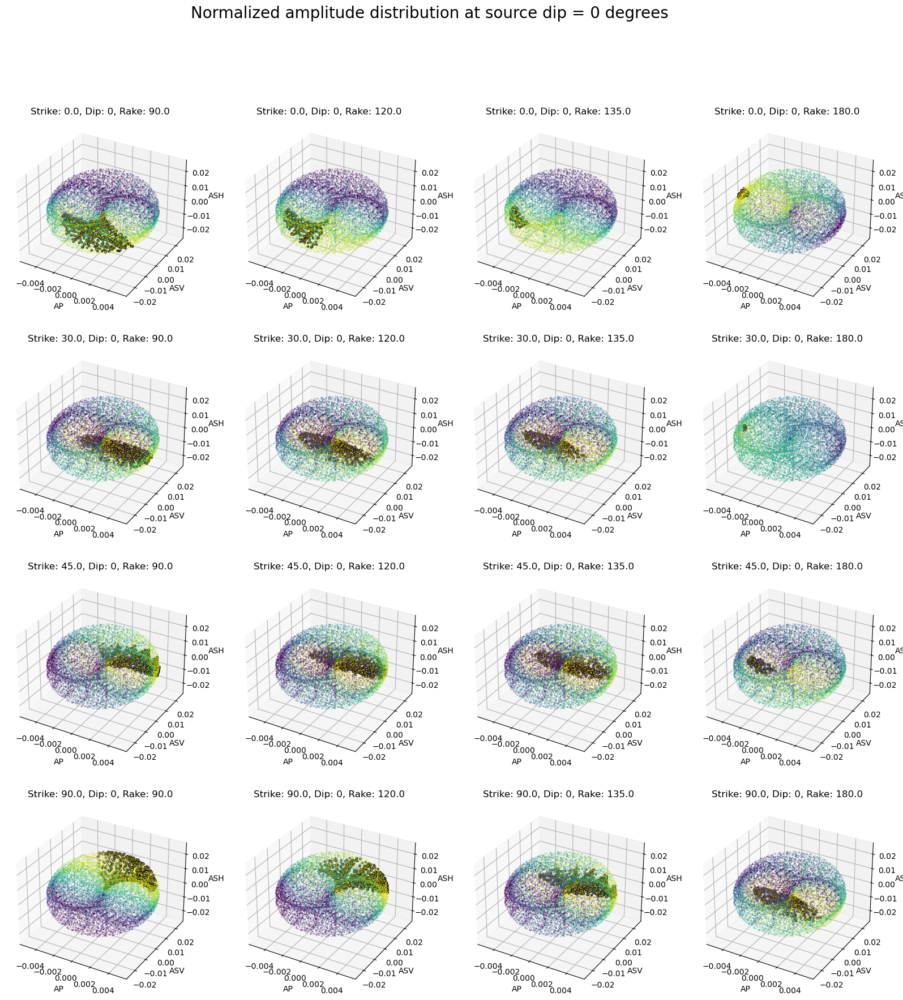

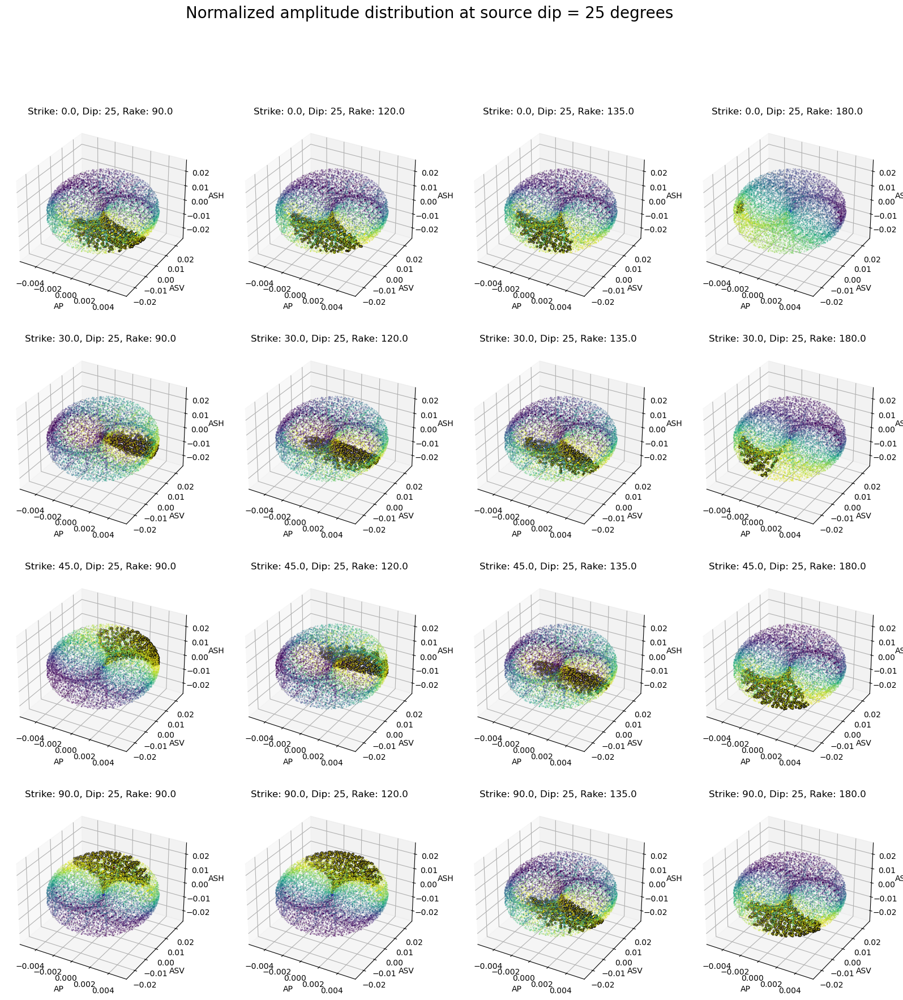

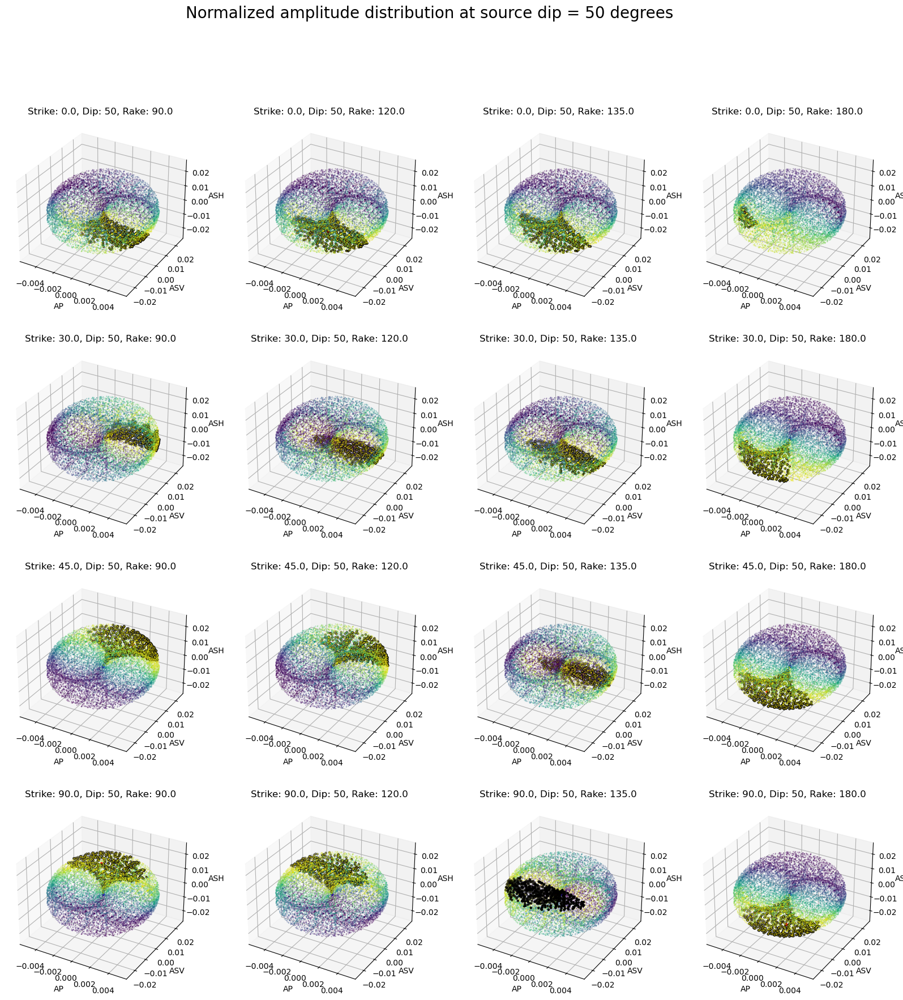

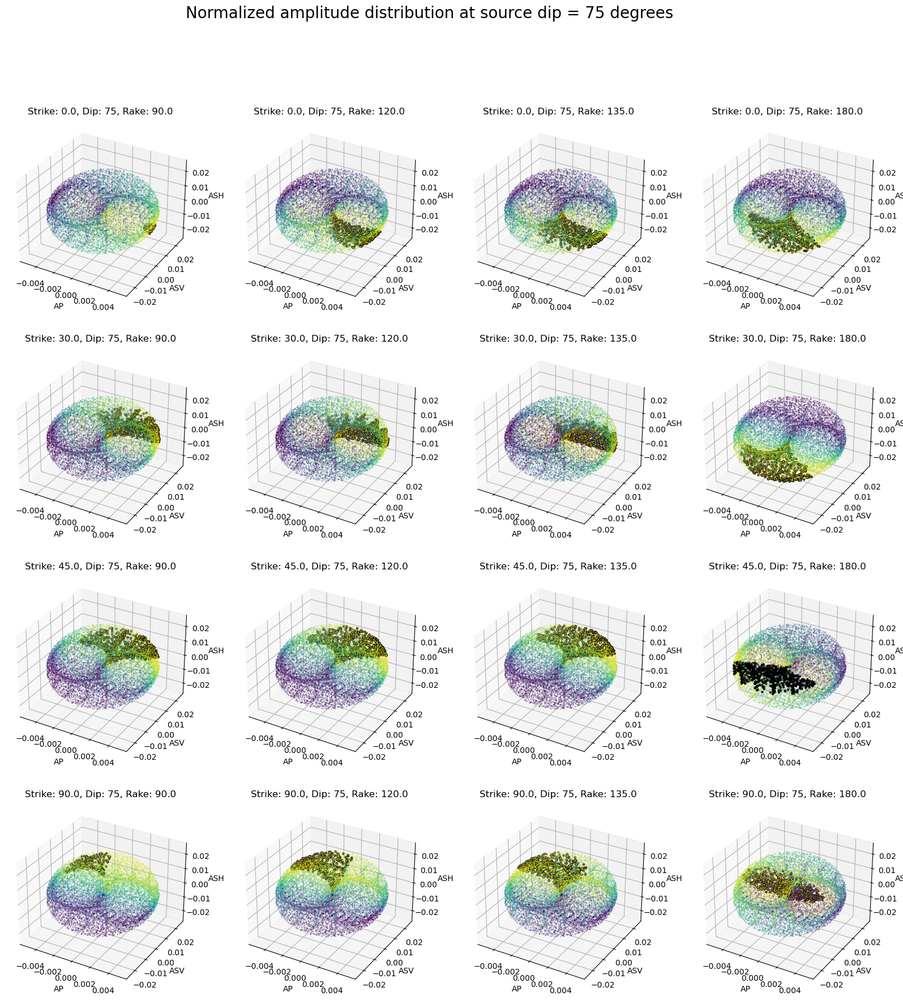

In [5]:
# play with the quadrants for different combinations of strike and rake
invert_per_mechanism(strike_quadrant=1, rake_quadrant=4, step_size=10)

In [9]:
def tp_per_mechanism(strike_quadrant, rake_quadrant, step_size, num_subplots=4):
    '''
    Generate relevant subplots, changing source mechanism
    Strike and rake quadrants are 1-4
    Step_size is the grid search step size
    '''

    s0 = (strike_quadrant-1)*90.
    strikes = array([s0, s0+30, s0+45, s0+90])
    dips = arange(0,90,25)
    r0 = (rake_quadrant-3)*90.
    rakes = array([r0, r0+30, r0+45, r0+90])
    sdr_sources = []
    for ss in strikes:
        for dd in dips:
            for rr in rakes:
                sdr_sources.append(array([ss, dd, rr]))
    # seismic velocity model

    model = TauPyModel(model='ak135')

    hdepth = 15
    epdist = 10
    azimuth = 200

    arrivals = model.get_travel_times(source_depth_in_km=hdepth,
                                    distance_in_degree=epdist, phase_list=['P', 'S'])
    takeoff_angles = [a.takeoff_angle for a in arrivals]
    alpha, beta = 5.8000, 3.4600

    # generate list of amplitude vectors
    Aos = []
    for sdr in sdr_sources:
        Aos.append(array(fx.Rpattern(sdr, azimuth, takeoff_angles, [alpha, beta])))
    # perform inversion for each amplitude vector

    threshold = 0.98

    # grid search
    s_range = arange(0, 360, step_size)
    d_range = arange(0, 90, step_size)
    r_range = arange(-180, 180, step_size)

    # sdr_grid: happens once no matter what
    sdr_grid = zeros((len(s_range), len(d_range), len(r_range), 3))
    amplitudes = zeros((len(s_range), len(d_range), len(r_range), 3))
    unit_amplitudes = zeros((len(s_range), len(d_range), len(r_range), 3))
    for i in range(len(s_range)):
        for j in range(len(d_range)):
            for k in range(len(r_range)):
                sdr = array([s_range[i], d_range[j], r_range[k]])
                sdr_grid[i, j, k, :] = sdr
                amplitude = fx.Rpattern(sdr, azimuth, takeoff_angles, [alpha, beta])
                amplitudes[i, j, k, :] = amplitude
                unit_amplitudes[i, j, k, :] = amplitude/linalg.norm(amplitude)
    unit_amp_plot = unit_amplitudes.reshape(-1, 3)

    # invert per figure
    fig_count = 0
    subplot_count = 0

    for dd in dips: # each slice (figure)
        fig, axes = plt.subplots(len(strikes), len(rakes),
                        subplot_kw={'projection': '3d'}, figsize=(20, 20))
        fig.suptitle(f'TP axis orientations at source dip = {dd} degrees', fontsize=20)
        
        for s_ind, ss in enumerate(strikes): # each row (subplot)
            for r_ind, rr in enumerate(rakes): # each column (subplot)
                exact_count = fig_count*len(strikes)*len(rakes) + subplot_count
                high_amplitudes = []
                high_unit_amplitudes = []
                high_tps = []
                cossims = zeros((len(s_range), len(d_range), len(r_range)))
                high_cossims = []
                
                for i in range(len(s_range)):
                    for j in range(len(d_range)):
                        for k in range(len(r_range)):
                            sdr = sdr_grid[i, j, k, :]
                            amplitude = amplitudes[i, j, k, :]
                            unit_amplitude = unit_amplitudes[i, j, k, :]
                            cossims[i, j, k] = fx.cossim(Aos[exact_count], amplitude)
                            if cossims[i, j, k] > threshold:
                                # high_amplitudes.append(amplitude)
                                # high_unit_amplitudes.append(unit_amplitude)
                                high_tps.append(fx.sdr2tp(sdr, deg=True))
                                high_cossims.append(cossims[i, j, k])
                # high_amplitudes = array(high_amplitudes).reshape(-1, 3)
                # high_unit_amplitudes = array(high_unit_amplitudes).reshape(-1, 3)
                high_tps = array(high_tps)
                high_cossims = array(high_cossims)
                # return
                
                ax = axes[s_ind, r_ind]
                ax.set_box_aspect([1,1,.5])
                ax.scatter(high_tps[:,0,0], high_tps[:,0,1], high_tps[:,0,2],
                        c=high_cossims, cmap='Greys', s=5, label="T-axis")
                ax.scatter(high_tps[:,1,0], high_tps[:,1,1], high_tps[:,1,2],
                        c=high_cossims, cmap='Blues', s=5, label="P-axis")
                
                # add Ao to the scatter plot
                ax.scatter(Aos[exact_count][0], Aos[exact_count][1], Aos[exact_count][2],
                        c='r', s=10, label='Observed amp')
                ax.scatter(0, 0, 0, c='b', s=10, label='Origin')
                
                ax.set_title(f'Strike: {ss}, Dip: {dd}, Rake: {rr}')
                ax.set_xlabel('X')
                ax.set_ylabel('Y')
                ax.set_zlabel('Z')
                # ax.legend()
                
                subplot_count += 1
                
                if subplot_count == len(strikes)*len(rakes):
                    fig_count += 1
                    subplot_count = 0
                    plt.show()
                
                if fig_count == num_subplots:
                    break

In [ ]:
# INCLUDE TRUE T P AXES HIGHLIGHTED

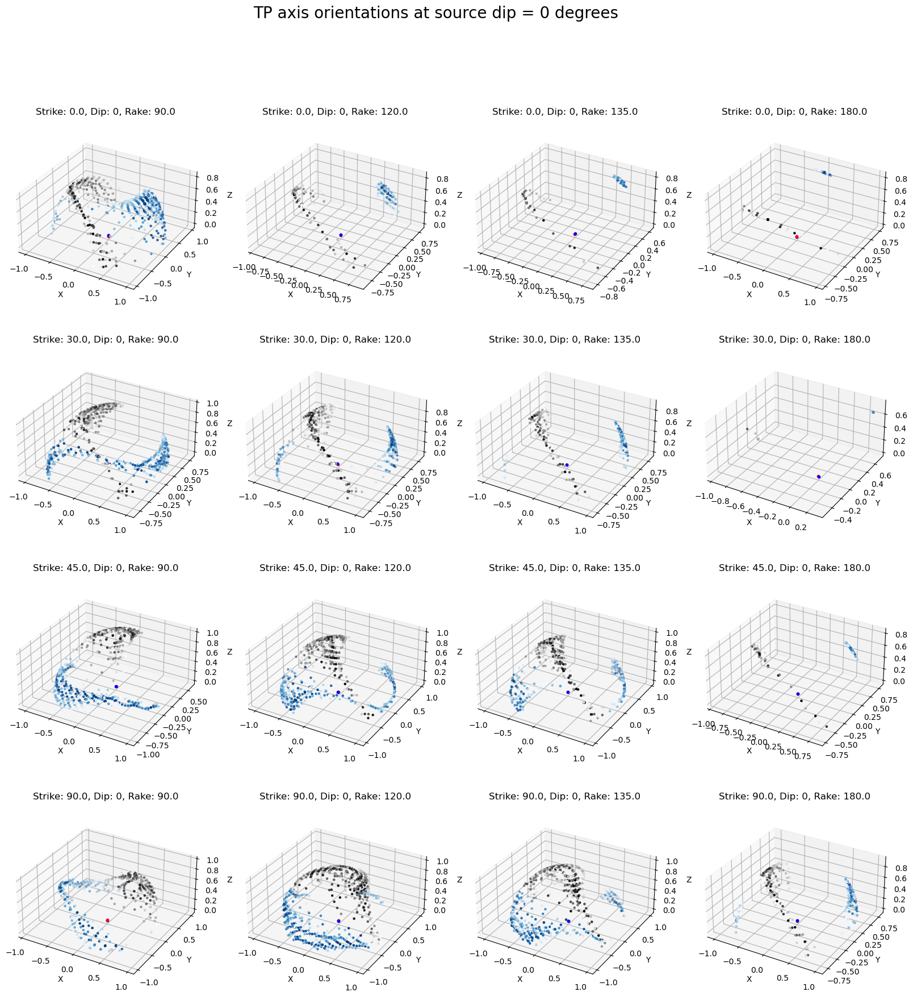

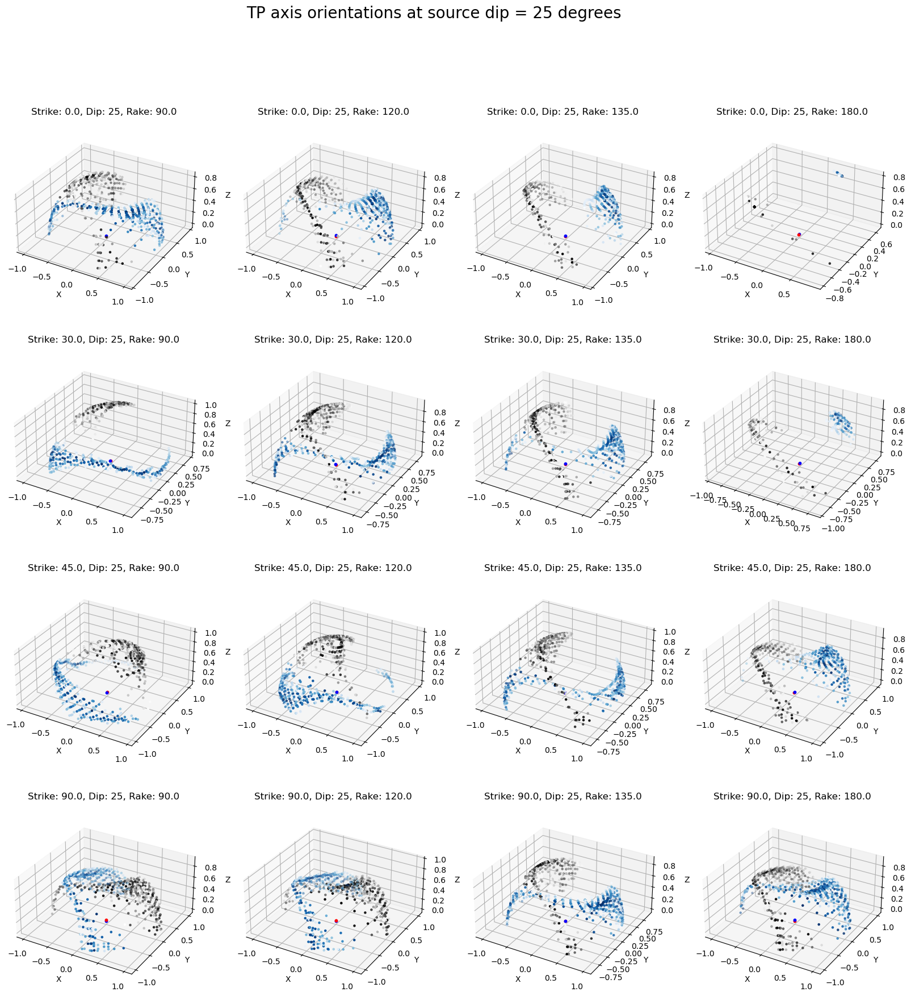

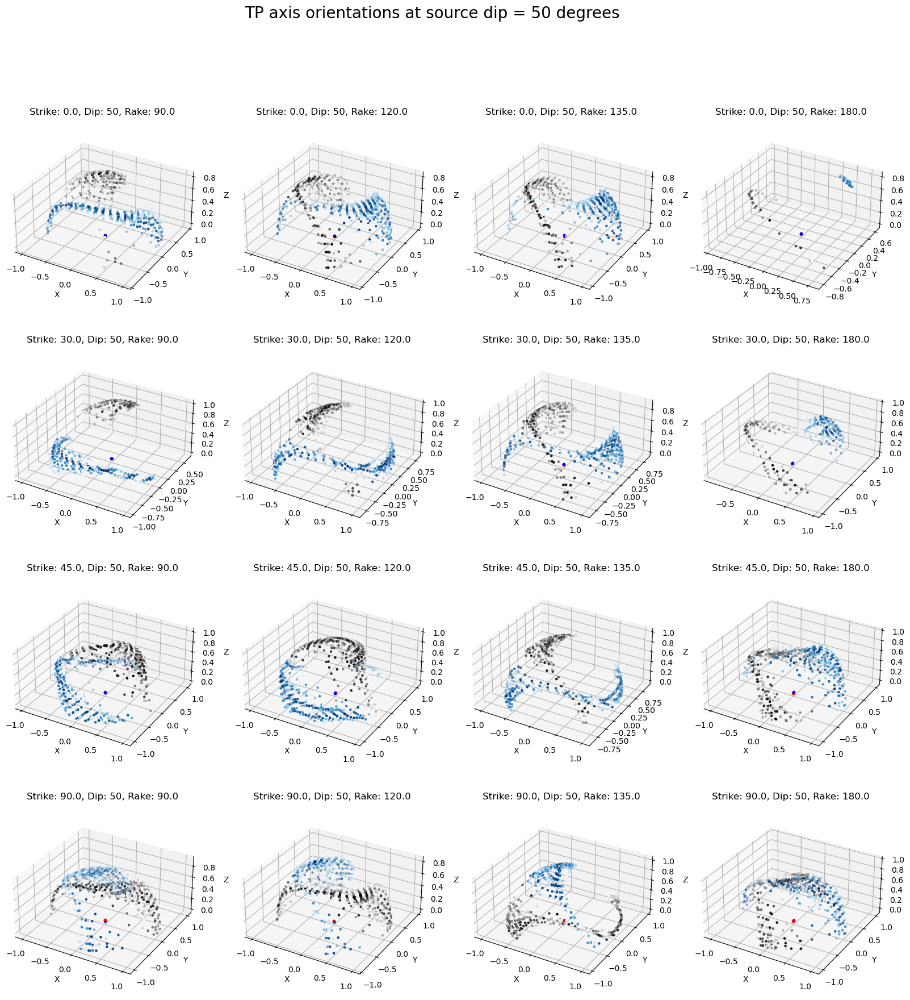

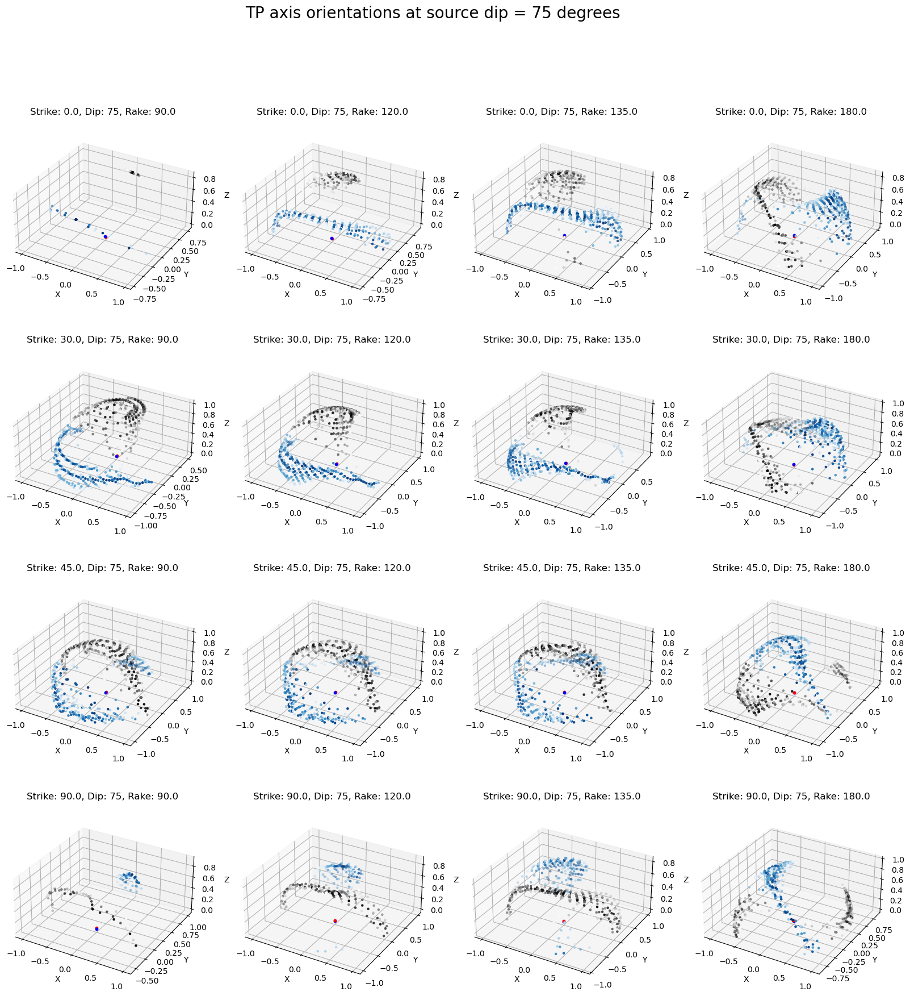

In [10]:
# play with the quadrants for different combinations of strike and rake
tp_per_mechanism(strike_quadrant=1, rake_quadrant=4, step_size=10)

In [ ]:
# plotting beachballs for these mechanisms
